# Prediction of Job Cost

### Objective:
Prediction of the cost incured for a specific job based on select features.

In [1]:
# Numeric libraries
import pandas as pd
import numpy as np

# Visulization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.express import bar , scatter
from plotly.subplots import make_subplots
from plotly.offline import plot, iplot ,offline
offline.init_notebook_mode()

In [2]:
# Visual setup
from matplotlib import rcParams
plt.style.use('fivethirtyeight')   # alternatives below
rcParams['axes.spines.right'] = False
rcParams['axes.spines.top'] = False
plt.rc('xtick', labelsize=11)
plt.rc('ytick', labelsize=11)
custom_colors = ['#74a09e','#86c1b2','#98e2c6','#f3c969','#f2a553', '#d96548', '#c14953']
sns.set_palette(custom_colors)
%config InlineBackend.figure_format = 'retina'

In [3]:
# Pandas options
pd.set_option('max_colwidth', 40)
pd.options.display.max_columns = None  # Possible to limit
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [4]:
# Helper libraries
import warnings
warnings.filterwarnings('ignore')

In [5]:
raw_data = pd.read_csv("example.work.orders Sep 18.csv")
raw_data.head()

,JOB_ID,JOB_TYPE,DEPTH_M,DIAMETER_MM,MATERIAL,LENGTH_M,JOB_COST
0,Job 1,Replace,2.19,200,ST,31.55,19847.644300
1,Job 2,Replace,2.27,63,AC,15.14,4476.588985
2,Job 3,Repair,3.64,450,ST,15.17,16871.484850
3,Job 4,Replace,2.28,200,AC,15.64,11158.144200
4,Job 5,Replace,2.40,200,ST,39.23,16913.611580


In [6]:
print("The dimensions of the dataset is: ", raw_data.shape)

The dimensions of the dataset is:  (5000, 7)


**The dataset has 5000 rows and 7 columns.**

The columns are:

**INDEPENDENT COLUMNS:**
1. JOB_ID: This is the identification number of the Job
2. JOB_TYPE: This column describes the different Job types
3. DEPTH_M: This column tells us at what depth the pipe is laid under the ground. The depth is measured in meters.
4. DIAMETER_MM: This column tells us the diameter of the pipe. The diameter is measured in millimeters.
5. MATERIAL: This column tells us the material of the pipe laid.
6. LENGTH_M: This column tells us the length of each pipe laid. The length is measured in meters.

**DEPENDENT COLUMN:**
7. JOB_COST: This is the dependent column. This column tells us the cost associated with each job.

In [7]:
# Lets check for the null values if any in the dataset

raw_data.isnull().sum()

JOB_ID         0
JOB_TYPE       0
DEPTH_M        0
DIAMETER_MM    0
MATERIAL       0
LENGTH_M       0
JOB_COST       6
dtype: int64

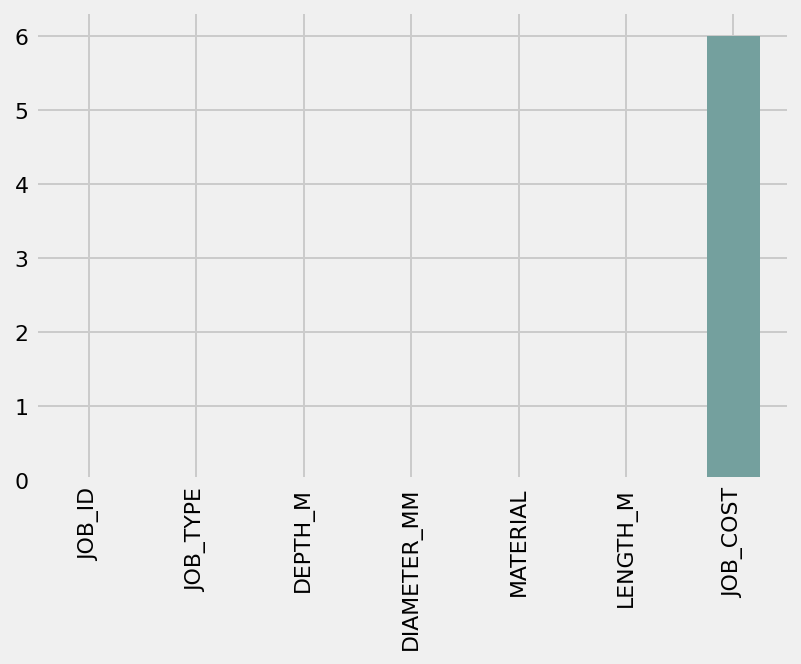

In [8]:
raw_data.isna().sum().plot(kind='bar');

We see that only the dependent column in the dataset has 6 null values.
Since the dependent variable has a null value, and the number of rows having hull value is very small, these rows can be dropped. Also, with dependent variable having null values will not add any predicting power to our model.

In [9]:
# Dropping null value rows from the dataframe
raw_data_1 = raw_data.dropna()

raw_data_1.isnull().sum()

JOB_ID         0
JOB_TYPE       0
DEPTH_M        0
DIAMETER_MM    0
MATERIAL       0
LENGTH_M       0
JOB_COST       0
dtype: int64

The data frame does not have null values now

In [10]:
raw_data_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4994 entries, 0 to 4999
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   JOB_ID       4994 non-null   object 
 1   JOB_TYPE     4994 non-null   object 
 2   DEPTH_M      4994 non-null   float64
 3   DIAMETER_MM  4994 non-null   int64  
 4   MATERIAL     4994 non-null   object 
 5   LENGTH_M     4994 non-null   float64
 6   JOB_COST     4994 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 312.1+ KB


**We have 3 catagorical columns and 4 numerical columns.**

In [11]:
raw_data_1.describe(include = "all")

,JOB_ID,JOB_TYPE,DEPTH_M,DIAMETER_MM,MATERIAL,LENGTH_M,JOB_COST
count,4994,4994,4994.000000,4994.000000,4994,4994.000000,4994.000000
unique,4994,2,NaN,NaN,3,NaN,NaN
top,Job 758,Replace,NaN,NaN,AC,NaN,NaN
freq,1,3504,NaN,NaN,2557,NaN,NaN
mean,NaN,NaN,2.670805,733.742491,NaN,25.132765,10207.698215
std,NaN,NaN,0.853169,24501.573970,NaN,9.094583,9534.848466
min,NaN,NaN,-4.660000,50.000000,NaN,8.160000,586.506169
25%,NaN,NaN,2.002500,63.000000,NaN,17.810000,3978.863093
50%,NaN,NaN,2.570000,90.000000,NaN,23.785000,6986.901196
75%,NaN,NaN,3.270000,200.000000,NaN,31.657500,12884.617365


**Observations:**

1. We can see that the JOB_ID column has 4994 unique entries in 4994 rows. Therefore this is considered as an artifact for the dataset and this column can be dropped. The JOB_ID column will not add any predicting power to out Machine Learning Model.

2. JOB_TYPE has 2 unique entries. Material has 3 unique entries. These two columns needs to be converted into numerical columns before using our data for modelling.

**We shall now look deeper into both the catagorical column data.**

In [12]:
def printdict(dict):
    for i in dict:
        print(i,":",dict[i])

In [13]:
job_type_data = raw_data_1["JOB_TYPE"].value_counts().to_dict()
print("The unique values in column Job_type is:")
printdict(job_type_data)

The unique values in column Job_type is:
Replace : 3504
Repair : 1490


In [14]:
Material_data = raw_data_1["MATERIAL"].value_counts().to_dict()
print("The unique values in column Material is:")
printdict(Material_data)

The unique values in column Material is:
AC : 2557
CI : 1431
ST : 1006


In [15]:
raw_data_2 = raw_data_1.drop("JOB_ID", axis = 1)
raw_data_2.shape

(4994, 6)

# Data Exploration

#### Since we have two catagorical data in our dataset we can combine these columns and see how the dependant variable (JOB_COST) varies with respect to the combined catagorical data.

In [16]:
pivot_data = raw_data_2.pivot_table(values = "JOB_COST", index = ["JOB_TYPE", "MATERIAL"], aggfunc="mean").reset_index()
pivot_data["JOB_TYPE + MATERIAL"] = pivot_data["JOB_TYPE"].astype(str)+"-"+pivot_data["MATERIAL"].astype(str)

In [17]:
import plotly.express as px
fig = px.bar(pivot_data, x='JOB_TYPE + MATERIAL', y='JOB_COST', color='JOB_TYPE', text = "JOB_COST")
fig.update_traces(textposition='outside')

In [18]:
pivot_data1 = raw_data_2.pivot_table(values = "JOB_COST", index = ["JOB_TYPE", "MATERIAL"], aggfunc=np.std).reset_index()
pivot_data1["JOB_TYPE + MATERIAL"] = pivot_data1["JOB_TYPE"].astype(str)+"-"+pivot_data1["MATERIAL"].astype(str)

In [19]:
fig = px.bar(pivot_data1, x='JOB_TYPE + MATERIAL', y='JOB_COST', color='JOB_TYPE', text = "JOB_COST")
fig.update_traces(textposition='outside')

## Outlier Detection

In [20]:
fig = px.histogram(raw_data_2, x="JOB_COST", color="JOB_TYPE", marginal="box")
fig.show()

##### From above graph we see a large number of outliers present in JOB_COST column for both JOB_TYPE's (Replace and Repair).

These outliers needs to be addressed (deleted). The distribution looks to be more or less normal except for the outliers (right skewed). Hence we can consider 3 Std Div from the mean value and remove the rest of the outlier values.

Before removing that we can check how many points fall outside this 3 Std div range on either side of the mean value

In [21]:
jobcost_mean_repair_type = np.mean(raw_data_2.JOB_COST[raw_data_2["JOB_TYPE"] == "Repair"])
jobcost_std_repair_type = np.std(raw_data_2.JOB_COST[raw_data_2["JOB_TYPE"] == "Repair"])

print("The average cost of a JOB_TYPE 'Repair' is: {jobcost_mean_repair_type: .2f}". format(jobcost_mean_repair_type=jobcost_mean_repair_type))
print("The standard deviation of a JOB_TYPE 'Repair' is: {jobcost_std_repair_type: .2f}". format(jobcost_std_repair_type=jobcost_std_repair_type))

The average cost of a JOB_TYPE 'Repair' is:  4363.32
The standard deviation of a JOB_TYPE 'Repair' is:  3508.34


In [22]:
jobcost_mean_replace_type = np.mean(raw_data_2.JOB_COST[raw_data_2["JOB_TYPE"] == "Replace"])
jobcost_std_replace_type = np.std(raw_data_2.JOB_COST[raw_data_2["JOB_TYPE"] == "Replace"])

print("The average cost of a JOB_TYPE 'Replace' is: {jobcost_mean_replace_type: .2f}". format(jobcost_mean_replace_type=jobcost_mean_replace_type))
print("The standard deviation of a JOB_TYPE 'Replace' is: {jobcost_std_replace_type: .2f}". format(jobcost_std_replace_type=jobcost_std_replace_type))

The average cost of a JOB_TYPE 'Replace' is:  12692.89
The standard deviation of a JOB_TYPE 'Replace' is:  10178.99


##### We see that the mean value of Job_Cost for a repair type of job is around 4300 (£) (approx) with standard deviation of 3500 (£) (approx).
##### Similarly for replace job type mean is around 12600 (£) (approx) with standard deviation of10100 (£) (approx).

##### The standard deviation or the variances around the mean value is too high because of the outliers.


##### These outliers can be dropped by using a range of mean +- (3*std div)

In [23]:
def remove_jobcost_outliers(df):
    df_out = pd.DataFrame()
    for key, subdf in df.groupby("JOB_TYPE"):
        mean = np.mean(subdf.JOB_COST)
        std = np.std(subdf.JOB_COST)
        reduced_df = subdf[(subdf.JOB_COST > (mean-3*std)) & (subdf.JOB_COST < (mean+3*std))]
        df_out = pd.concat([df_out, reduced_df], ignore_index=True)
    return df_out

raw_data_3 = remove_jobcost_outliers(raw_data_2)
raw_data_3.shape

(4888, 6)

In [24]:
fig = px.histogram(raw_data_3, x="JOB_COST", color="JOB_TYPE", marginal="box")
fig.show()

In [25]:
print("After outlier removal based on 3 times Standard Deviation:")

jobcost_mean_repair_type = np.mean(raw_data_3.JOB_COST[raw_data_3["JOB_TYPE"] == "Repair"])
jobcost_std_repair_type = np.std(raw_data_3.JOB_COST[raw_data_3["JOB_TYPE"] == "Repair"])

print("The average cost of a JOB_TYPE 'Repair' is: {jobcost_mean_repair_type: .2f}". format(jobcost_mean_repair_type=jobcost_mean_repair_type))
print("The standard deviation of a JOB_TYPE 'Repair' is: {jobcost_std_repair_type: .2f}". format(jobcost_std_repair_type=jobcost_std_repair_type))

jobcost_mean_replace_type = np.mean(raw_data_3.JOB_COST[raw_data_3["JOB_TYPE"] == "Replace"])
jobcost_std_replace_type = np.std(raw_data_3.JOB_COST[raw_data_3["JOB_TYPE"] == "Replace"])

print("The average cost of a JOB_TYPE 'Replace' is: {jobcost_mean_replace_type: .2f}". format(jobcost_mean_replace_type=jobcost_mean_replace_type))
print("The standard deviation of a JOB_TYPE 'Replace' is: {jobcost_std_replace_type: .2f}". format(jobcost_std_replace_type=jobcost_std_replace_type))

After outlier removal based on 3 times Standard Deviation:
The average cost of a JOB_TYPE 'Repair' is:  4057.08
The standard deviation of a JOB_TYPE 'Repair' is:  2824.18
The average cost of a JOB_TYPE 'Replace' is:  11844.39
The standard deviation of a JOB_TYPE 'Replace' is:  8370.59


In [26]:
fig = px.histogram(raw_data_3, x="JOB_COST", color="MATERIAL", marginal="box")
fig.show()

## Univariate Analysis

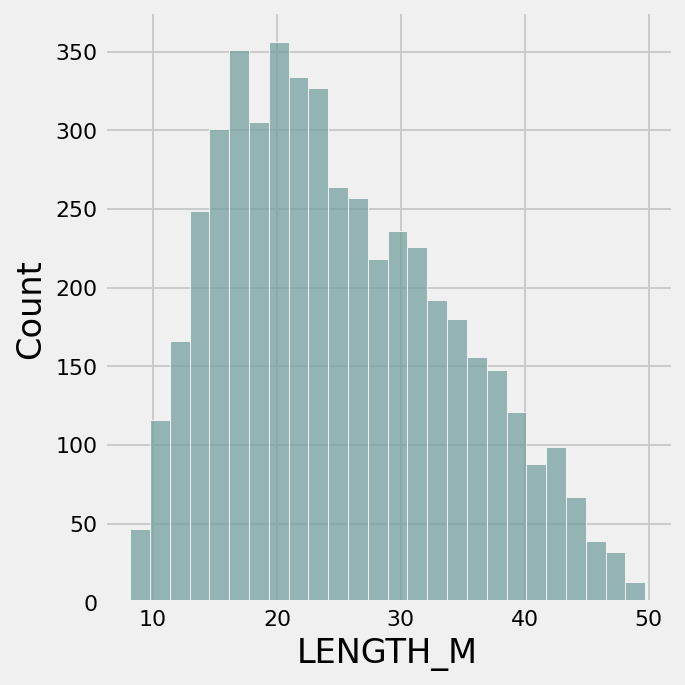

In [27]:
fig = sns.displot(raw_data_3["LENGTH_M"])

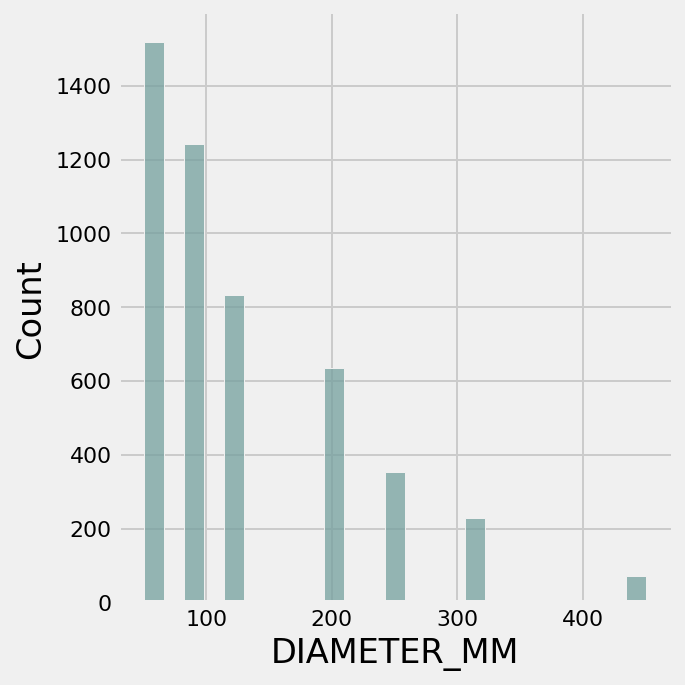

In [28]:
fig = sns.displot(raw_data_3[raw_data_3["DIAMETER_MM"]<500], x = "DIAMETER_MM")

In [29]:
diameter_dict = raw_data_3.DIAMETER_MM.value_counts().to_dict()
printdict(diameter_dict)

90 : 1243
63 : 1051
125 : 834
200 : 635
50 : 467
250 : 354
315 : 230
450 : 71
999999 : 3


We see that there are three rows in out dataset where we have a diameter value reading as 999999. Usually, when we do not have a valid entry data for a numerical column, these data are filled using 999999. This is a dummy entry. Therefore these rows needs to be dropped.

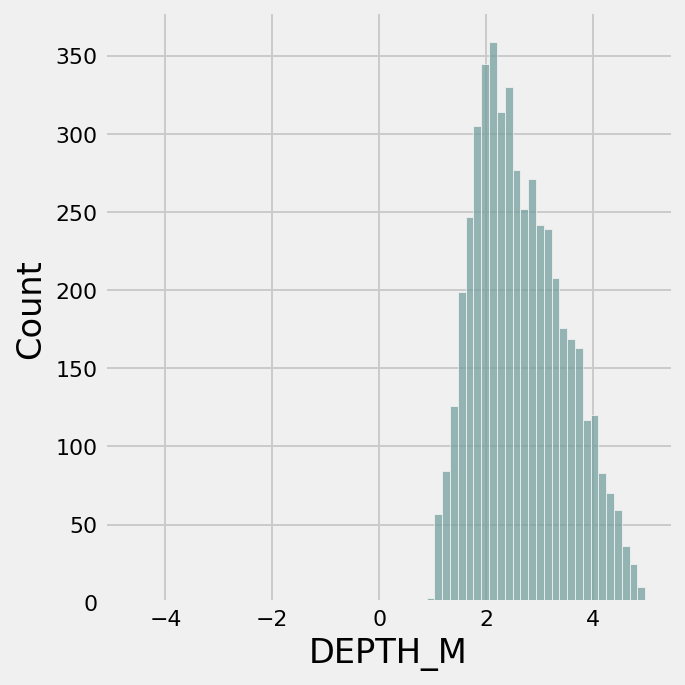

In [30]:
fig = sns.displot(raw_data_3["DEPTH_M"])

In [31]:
dummy_depth_dict = (raw_data_3.DEPTH_M[raw_data_3.DEPTH_M <= 0]).value_counts().to_dict()
printdict(dummy_depth_dict)

-4.66 : 1
-2.02 : 1


We see that there are two rows where the depth value is negative. Depth column tells us at what depth are the ppes laid. So practically speaking the depth value cannot be negative. These rows needs to be removed.

In [32]:
def remove_unwanted(df):
    df1 = df[df.DIAMETER_MM < 500]
    df2 = df1[df.DEPTH_M > 0]
    return df2

In [33]:
raw_data_4 = remove_unwanted(raw_data_3)
raw_data_4.shape

(4883, 6)

In [34]:
raw_data_4.describe()

,DEPTH_M,DIAMETER_MM,LENGTH_M,JOB_COST
count,4883.000000,4883.000000,4883.000000,4883.000000
mean,2.651651,128.070448,25.007086,9520.653992
std,0.835884,82.275894,9.059474,8016.125084
min,1.000000,50.000000,8.160000,586.506169
25%,1.990000,63.000000,17.700000,3928.197946
50%,2.540000,90.000000,23.610000,6870.420844
75%,3.230000,200.000000,31.520000,12155.832335
max,4.980000,450.000000,49.710000,42666.288480


#### Now from the above output we see that the mean values for each column is more or less close to the 50th percentile values. Thisdata can be now used to build our model.

##### But before entering model building we will see how the features are related.

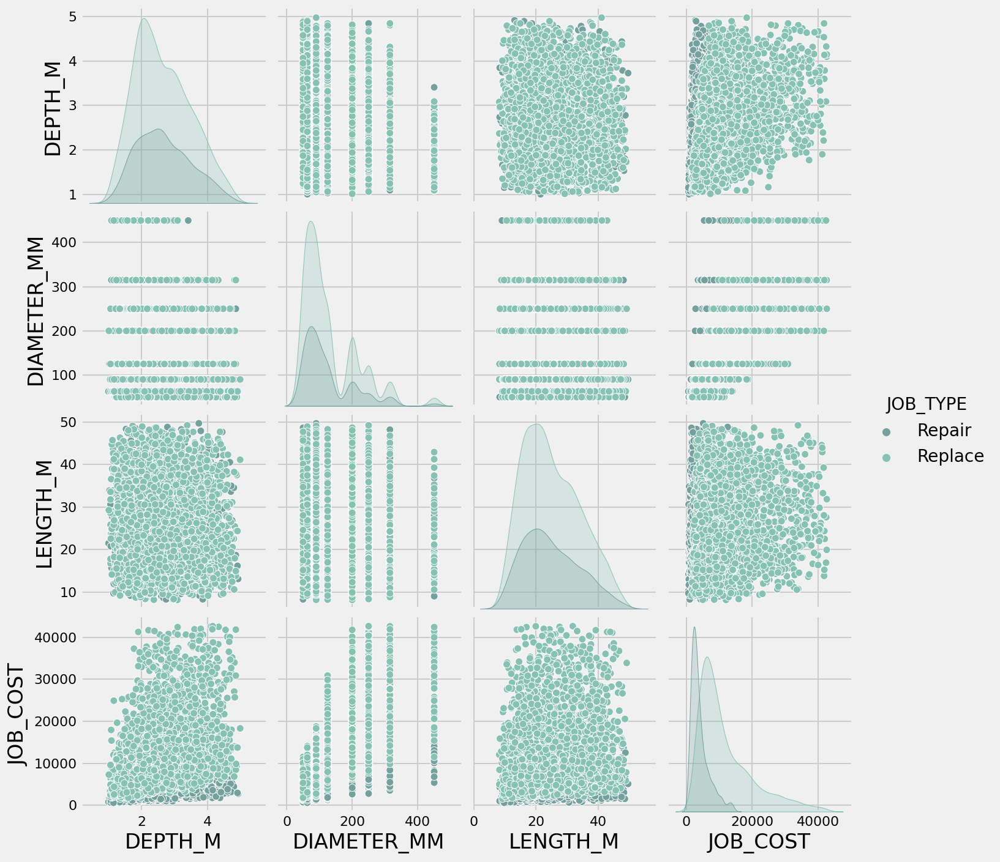

In [35]:
sns.pairplot(raw_data_4, hue = "JOB_TYPE", diag_kind="kde");

#### We see, except for job_cost, all other data shows similar distribution for both Job_Type (Repair and Replace).

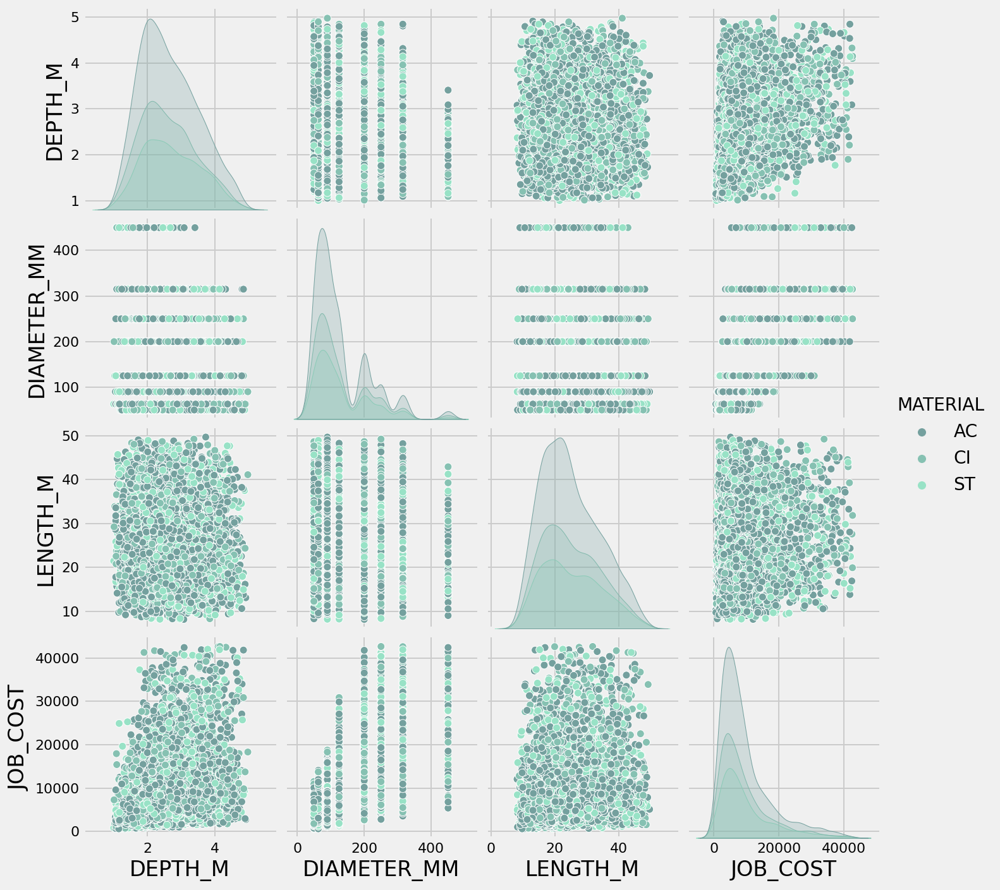

In [36]:
sns.pairplot(raw_data_4, hue = "MATERIAL", diag_kind="kde");

#### We see, all columns shows similar distribution for all three Material types.

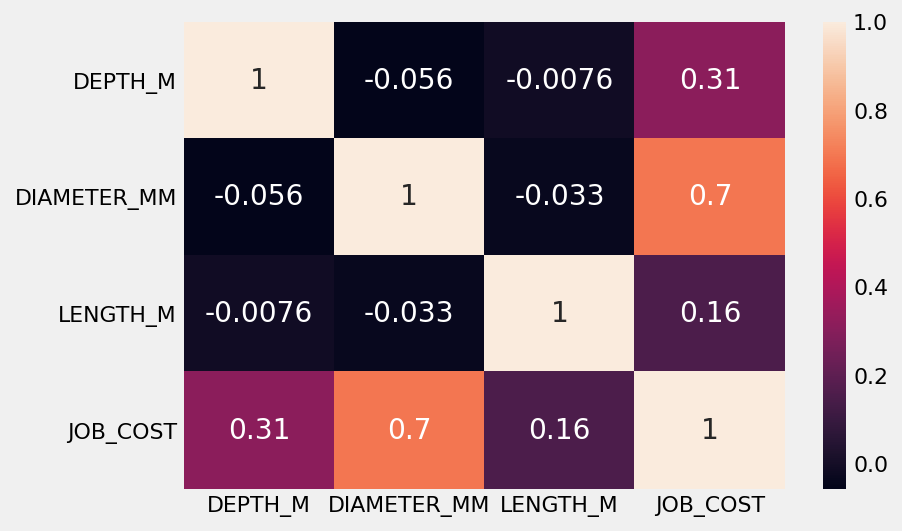

In [37]:
data_correlation = raw_data_4.corr()
sns.heatmap(data_correlation, annot = True)

#### The correlation heat map gives us further insight into the data.

**Obserrvations**
1. The independent variables does not show any correlation (That means there is no linear relation between the independent variables). Our assumption of the data not having multi-colinearity is satisified.
2. The dependent variables shows resonably good corrrelation with the independent variable (DEPTH_M to JOB_COST: positive 0.31, LENGTH_M to JOB_CST: positive 0.16 and DIAMETER_MM to JOB_COST a positive 0.7).These can be considered to be good predictors.

In [38]:
fig = px.scatter(raw_data_4, x="DEPTH_M", y="LENGTH_M", 
                 color="MATERIAL", 
                 size='JOB_COST',  
                 hover_data=['JOB_TYPE']) 
  
fig.show()

##### Before modeling we need to encode our catagorical data into numerical values. This can be acheived by One-Hot Encding Method.

### One Hot Encoding

In [39]:
def onehot(data):
    cat=data.select_dtypes(include=['object'])
    cat_columns=list(cat.columns)
    data = pd.concat([data.drop(cat_columns, axis=1), pd.get_dummies(cat, drop_first = True)], axis=1)
    return data

In [40]:
final_data = onehot(raw_data_4)
final_data.head()
final_data.to_csv("Cleaned_Data.csv")

,DEPTH_M,DIAMETER_MM,LENGTH_M,JOB_COST,JOB_TYPE_Replace,MATERIAL_CI,MATERIAL_ST
0,3.34,50,42.22,2263.508101,0,0,0
1,3.25,90,29.47,3760.815160,0,1,0
2,1.78,315,17.78,6000.263911,0,0,1
3,4.46,63,24.65,3179.626731,0,1,0
4,2.89,90,21.71,3003.181829,0,0,0


The final cleaned data is now split into independent and target datasets. This independent and target datasets are further split  into training and test dataset.

In [41]:
final_data.columns

Index(['DEPTH_M', 'DIAMETER_MM', 'LENGTH_M', 'JOB_COST', 'JOB_TYPE_Replace',
       'MATERIAL_CI', 'MATERIAL_ST'],
      dtype='object')

In [42]:
# Independant Dataset

X = final_data.drop("JOB_COST", axis = 1)

# Target Dataset

y = final_data["JOB_COST"]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [43]:
# To come up with the best model and the best parameters for the model, we have to test different models

# importing different models to check which model gives best result

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

In [44]:
from sklearn import metrics

In [45]:
def regression_metrics(model_name, actual_y, predicted_y):
    reg_metrics = {
                    "Root Mean Square Error": metrics.mean_squared_error(actual_y, predicted_y)**0.5,
                    "Mean Squared Error": metrics.mean_absolute_error(actual_y, predicted_y),
                    "R^2": metrics.r2_score(actual_y, predicted_y),
                    "Explained Variances": metrics.explained_variance_score(actual_y, predicted_y),
                    "Absolute Mean Squared Error": metrics.mean_absolute_error(actual_y, predicted_y)
    }
    
    df_regr_metrics = pd.DataFrame.from_dict(reg_metrics, orient='index')
    df_regr_metrics.columns = [model_name]
    return df_regr_metrics

In [46]:
# Using Linear Regression as first model
lr = LinearRegression()
lr_fit = lr.fit(X_train, y_train)

# Predict the y values
y_train_predict = lr_fit.predict(X_train)
y_test_predict = lr_fit.predict(X_test)

linreg_metrics = regression_metrics('Linear Regression', y_test, y_test_predict)
linreg_metrics

,Linear Regression
Root Mean Square Error,3129.192395
Mean Squared Error,2216.003292
R^2,0.830423
Explained Variances,0.830574
Absolute Mean Squared Error,2216.003292


In [47]:
models = {
            "Linear Regression": LinearRegression(), 
            "Lasso Regression": Lasso(), 
            "Ridge Regression": Ridge(), 
            "Decision Tree Regression": DecisionTreeRegressor(), 
            "XG Boost Regression": XGBRegressor()
}

def reg_metrics_df(models, X_train, X_test, y_train, y_test):
    reg_metrics = pd.DataFrame()
    for model_name, model in models.items():
        model = model
        # print(model_name, model)
        model.fit(X_train, y_train)
        
        y_train_predict = model.predict(X_train)
        y_test_predict = model.predict(X_test)
        
        """print('R^2 training: %.3f, R^2 test: %.3f' % (
                          (metrics.r2_score(y_train, y_train_predict)), 
                          (metrics.r2_score(y_test, y_test_predict))))"""
        
        
        reg_metrics = pd.concat([reg_metrics, regression_metrics(model_name, y_test, y_test_predict)], axis = 1)
        
    return reg_metrics

In [48]:
reg_metrics_df(models, X_train, X_test, y_train, y_test)

,Linear Regression,Lasso Regression,Ridge Regression,Decision Tree Regression,XG Boost Regression
Root Mean Square Error,3129.192395,3129.145075,3129.108596,1765.652736,1275.199776
Mean Squared Error,2216.003292,2215.584537,2215.227834,1122.226021,848.033155
R^2,0.830423,0.830428,0.830432,0.946010,0.971838
Explained Variances,0.830574,0.830579,0.830584,0.946153,0.971844
Absolute Mean Squared Error,2216.003292,2215.584537,2215.227834,1122.226021,848.033155


__Regression Summary:__  

In accordance with our analysis in the data exploratory phase, non-linear regression models like XGBoost and Decision Tree Regressor performed better than linear models like OLS, LASSO and Ridge regression. XGBoost clearly outperformed other models scoring RMSE of 848.03 (£), i.e. the model predicts cost within average error range of ±848.03 (£)


## From above table it is clear that the XGBoost model has the least RMSE value and also has got the highest value for Explained variace. 
#### this shows that the predictions made by XGBoost model has captured almost 97% of the variance in the test data.

#### This is closly followed by DecisionTreeRegressor model which explaines or captures about 95% variances in the test data.

##### The above scores are based on a Training and Test data set split once. There might be a chance that the model may be performing well because it has trained on the data set and the test dataset is very similar to the training dataset.

##### Therefore, cross validation is carried out to see how our model performs on an unseen data. KFold Crossvalidation is used to split the data into different datasets. Further GridSearchCV module is used to get the best parameters from the crossvalidation dataset.

In [49]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

cv = KFold(n_splits = 10, shuffle = True)
gs = GridSearchCV(estimator = Lasso(max_iter=1500),
                  param_grid={'selection' : ['cyclic', 'random']},
                  cv = cv, return_train_score=False)
gs.fit(X, y)

score_dict = {
            'Model': "Lasso",
            'Best Parameters': gs.best_params_,
            'Best Score': gs.best_score_
        }

for name, value in score_dict.items():
    print(name, ': ',value)

GridSearchCV(cv=KFold(n_splits=10, random_state=None, shuffle=True),
             estimator=Lasso(max_iter=1500),
             param_grid={'selection': ['cyclic', 'random']})

Model :  Lasso
Best Parameters :  {'selection': 'cyclic'}
Best Score :  0.8314236888579485


In [50]:
def best_model(X, y):
    algos = {
        'Lasso Regression': {
            'model': Lasso(max_iter=1500),
            'params': {
                'selection' : ['cyclic', 'random']
            }
        },
        'Ridge Regression': {
            'model': Ridge(),
            'params': {
                'max_iter': [500, 1000, 1500],
                'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
            }
        },
       'Decision Tree Regression': {
            'model': DecisionTreeRegressor(),
            'params': {
                'criterion': ["mse", "friedman_mse", "mae"],
                'splitter': ["best", "random"],
                'max_depth': [5,10,15,20,25]
            }
        },
        'XG Boost Regression': {
            'model': XGBRegressor(),
            'params': {
                'missing': [0, np.mean]
            }
        }
    }
    
    scores_1 = []
    cv = KFold(n_splits = 10, shuffle = True)
    for algo_name, config in algos.items():
        gs = GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
        gs.fit(X, y)
        scores_1.append({
            'Model': algo_name,
            'Best Parameters': gs.best_params_,
            'Best Score': gs.best_score_
        })
    
    return pd.DataFrame(scores_1, columns = ['Model', 'Best Parameters', 'Best Score'])

best_model(X, y)

,Model,Best Parameters,Best Score
0,Lasso Regression,{'selection': 'cyclic'},0.831320
1,Ridge Regression,"{'max_iter': 500, 'solver': 'lsqr'}",0.832139
2,Decision Tree Regression,"{'criterion': 'friedman_mse', 'max_d...",0.954478
3,XG Boost Regression,{'missing': 0},0.969856


##### From above table we see that the XGBoost model is still the best model for our dataset with the best score of 0.97. Again this is closly followeb by DecisionTreeRegressor with a score of 0.957 (~0.96).

##### Visualizer is used from yellobrick to see how the predicted target values is dispersed in comparison to the actual target values for different models.

In [51]:
from yellowbrick.datasets import load_concrete
from yellowbrick.regressor import ResidualsPlot

ResidualsPlot(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e03ab9280>,
              line_color=None, model=None, test_alpha=None, test_color=None,
              train_alpha=None, train_color=None)

0.8304225144650079

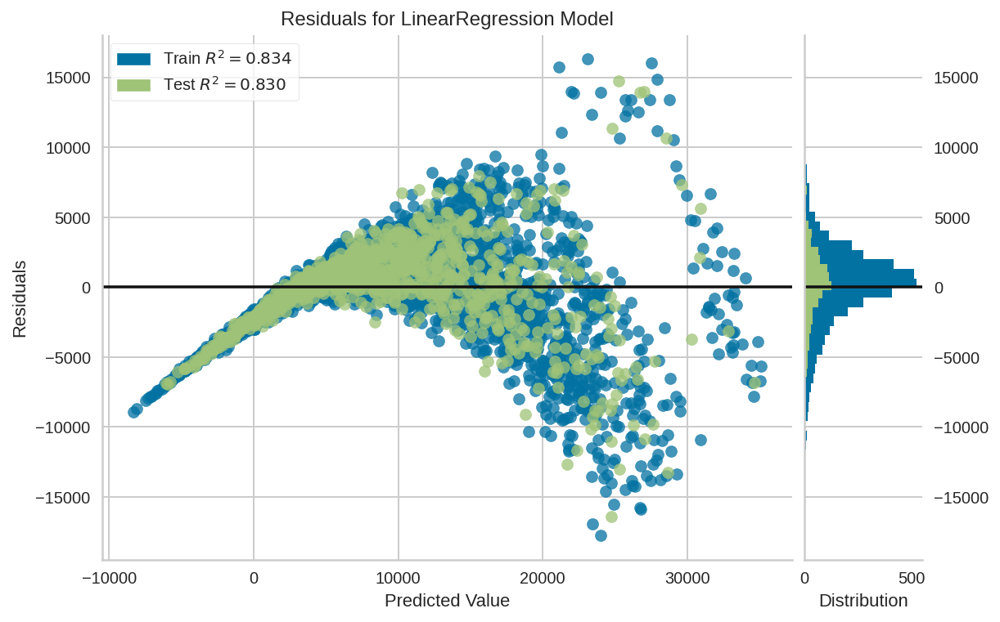

ResidualsPlot(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e03a648e0>,
              line_color=None, model=None, test_alpha=None, test_color=None,
              train_alpha=None, train_color=None)

0.8304276431473563

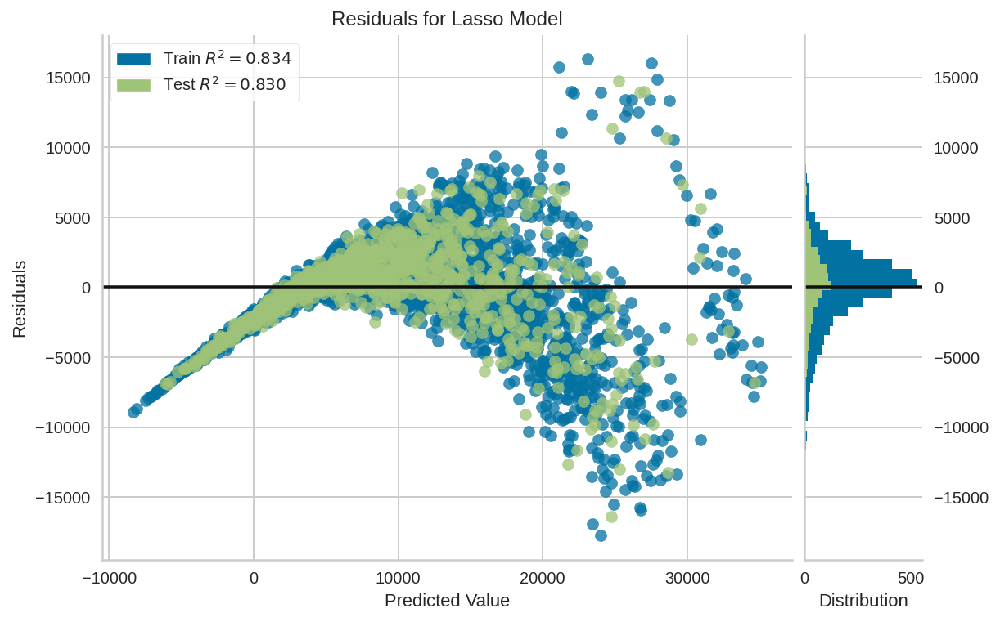

ResidualsPlot(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e041908e0>,
              line_color=None, model=None, test_alpha=None, test_color=None,
              train_alpha=None, train_color=None)

0.8304315968348776

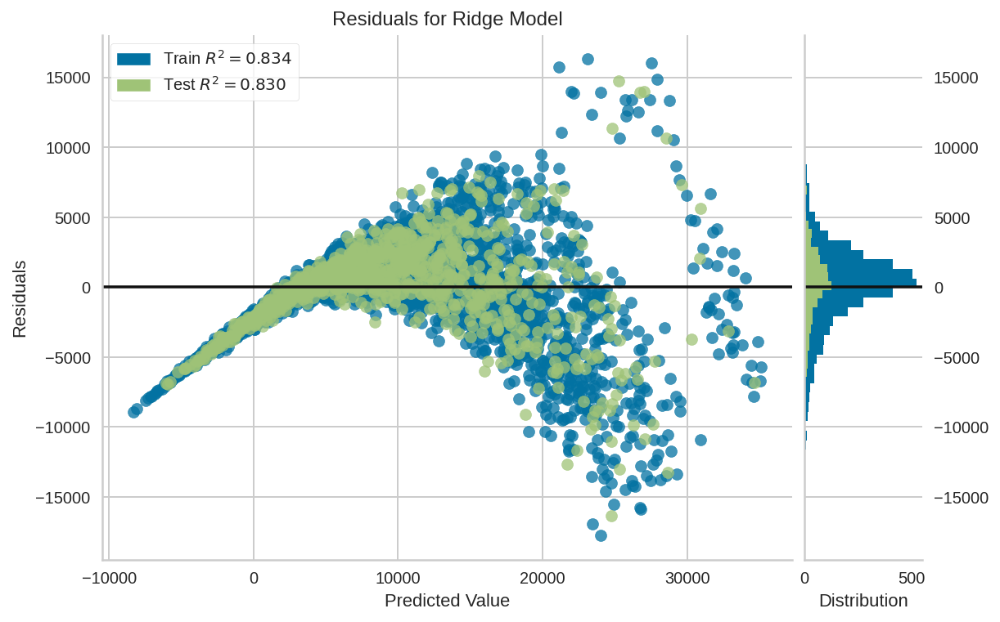

ResidualsPlot(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e041ddfa0>,
              line_color=None, model=None, test_alpha=None, test_color=None,
              train_alpha=None, train_color=None)

0.9460098862270773

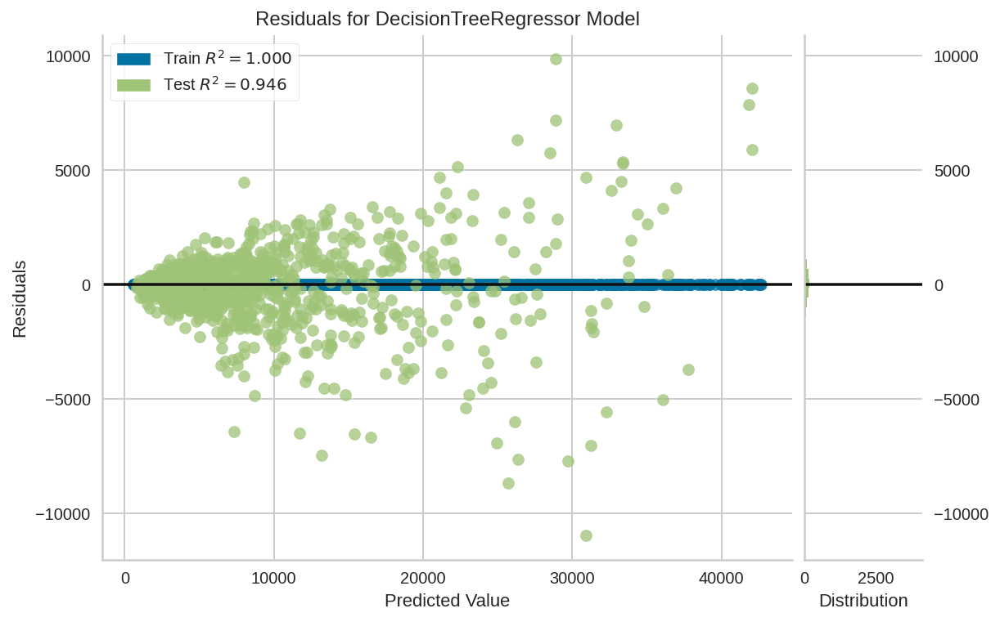

ResidualsPlot(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e039824f0>,
              line_color=None, model=None, test_alpha=None, test_color=None,
              train_alpha=None, train_color=None)

0.9718382191463952

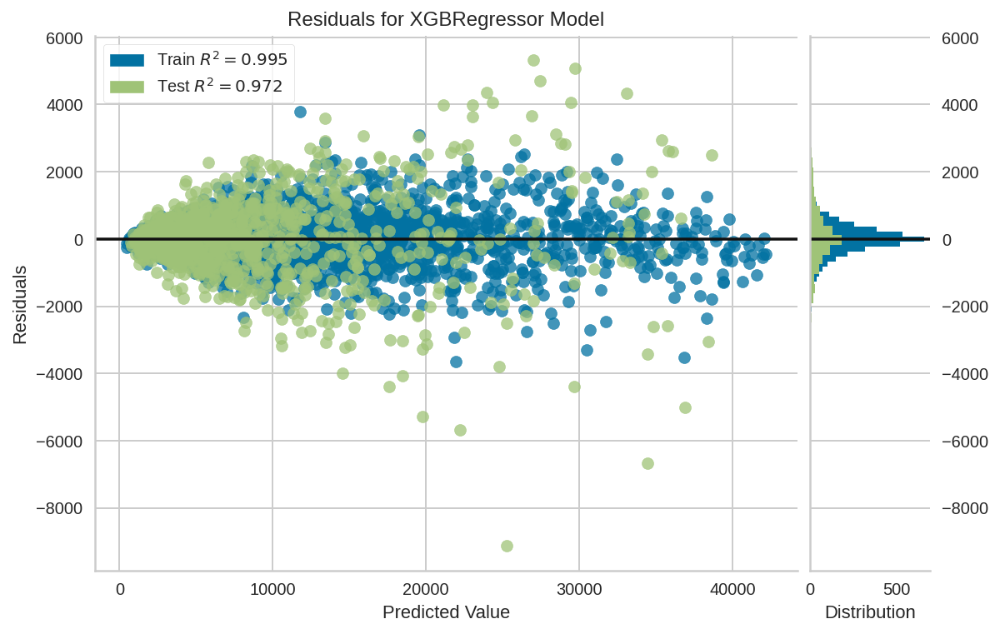

In [52]:
for model_name, model in models.items():
    model = model
    
    visualizer = ResidualsPlot(model);
    visualizer.fit(X_train, y_train);
    visualizer.score(X_test, y_test); 
    visualizer.show();

**From the GridSearchCV results and yellobrick visulization we see that the best model is XGBoost model with almost 0.97 score.**

**Therefore, this model is selected for our use**

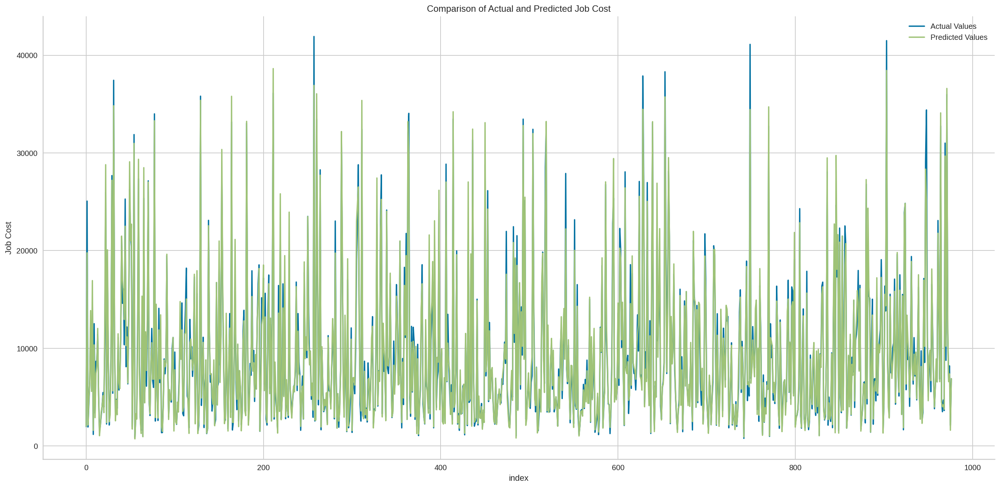

In [53]:
# Using XGBoost
xgb_reg = XGBRegressor()
xgb_reg_fit = xgb_reg.fit(X_train, y_train)

# Predict the y values
y_train_predict = xgb_reg_fit.predict(X_train)
y_test_predict = xgb_reg_fit.predict(X_test)

fig = plt.figure(figsize = (20,10))
plt.title("Comparison of Actual and Predicted Job Cost");
plt.xlabel("index");
plt.ylabel("Job Cost");
plt.plot(y_test.reset_index()["JOB_COST"], label = "Actual Values");
plt.plot(y_test_predict, label = "Predicted Values");
plt.legend();
plt.show();